# <img style="float: left; padding-right: 10px; width: 45px" src="https://raw.githubusercontent.com/Harvard-IACS/2018-CS109A/master/content/styles/iacs.png"> Mortality Prediction Using National Health and Nutrition Examination Survey Data
## CS109A/AC209A



**Harvard University**<br/>
**Fall 2021**<br/>
**Team members**: Rudra Barua, Rosan Bishwakarma, Albert Zhang, Jeremy Zhang


<hr style="height:2pt">

## Install Modules and Packages

### Install Modules

In [ ]:
# Install packages
!pip install missingno
!pip install shap

In [ ]:
# Using magic line in Colab
%tensorflow_version 1.x
# Install a specific version of tensor flow
# !pip install tensorflow==1.15.0

TensorFlow 1.x selected.


#### Import necessary packages

In [ ]:
# Import libraries

import random
random_seed = 0
random.seed(random_seed)

import os
import sys

import matplotlib.pyplot as pl
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.linear_model import LogisticRegressionCV
from sklearn.metrics import (
    accuracy_score, confusion_matrix, roc_curve, roc_auc_score
)                           
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.impute import SimpleImputer

%matplotlib inline

import itertools
import math

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_validate

from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegressionCV
from sklearn.linear_model import LinearRegression

from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

# pandas tricks for better display
pd.options.display.max_columns = 50  
pd.options.display.max_rows = 500     
pd.options.display.max_colwidth = 100
pd.options.display.precision = 3

%matplotlib inline
pd.set_option('display.width', 1000)

# extra packages
import missingno as msno

# explicitly require this experimental feature
from sklearn.experimental import enable_iterative_imputer  # noqa
# now you can import normally from sklearn.impute
from sklearn.impute import IterativeImputer

from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import ExtraTreesRegressor

from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

from sklearn.ensemble import RandomForestRegressor

import tensorflow as tf

from sklearn.preprocessing import normalize
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import *
from tensorflow.keras.callbacks import EarlyStopping

import shap

# Exploratory Data Analysis

### Data Overview

Title of Dataset

Summary of data

Source: DATASET SOURCE

In [ ]:
# Load the data, set random seed and display
mortality = pd.read_csv("Project_B_NHANESI_full.csv")

np.random.seed(random_seed)

display(mortality.shape)

(14407, 42)

### Visualizations

## Missing Values

[Text(0.5, 1.0, 'Correlation of Missing Data Heatap')]

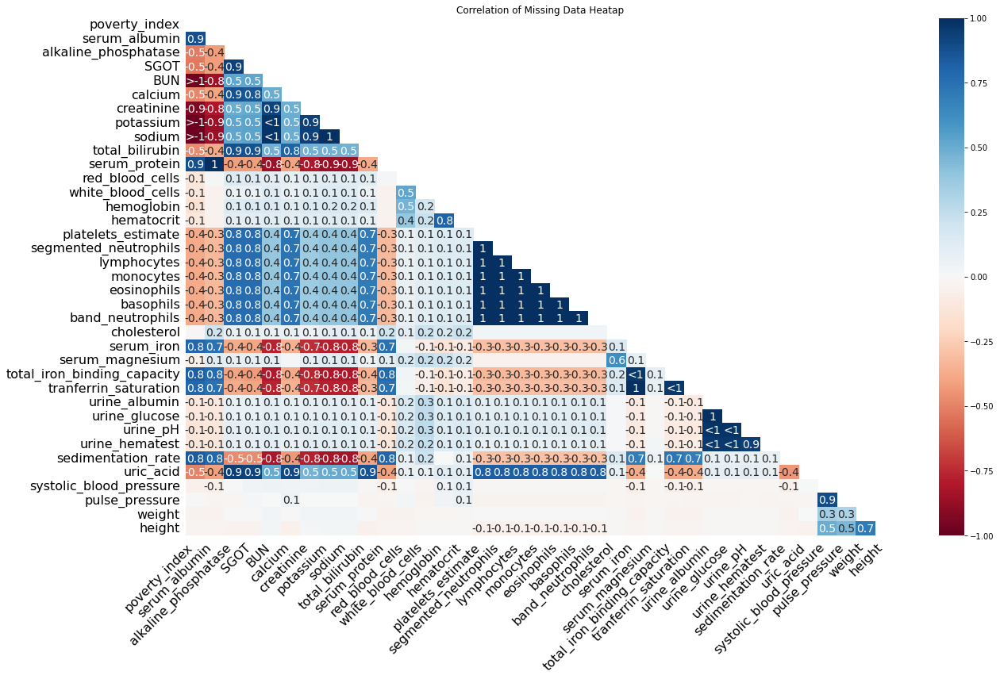

In [ ]:
# Visualizes correlations between missing values
msno.heatmap(mortality.sample(500)).set(title='Correlation of Missing Data Heatap')

In [ ]:
# Get the datatypes of each column
mortality_datatypes = pd.DataFrame(mortality.dtypes)
display(mortality_datatypes)

,0
sequence_ID,int64
sex_isFemale,bool
race,int64
poverty_index,float64
age,int64
serum_albumin,float64
alkaline_phosphatase,float64
SGOT,float64
BUN,float64
calcium,float64


## Column Information

In [ ]:
# Get the datatype of each column and the number of non missing values
column_info = pd.concat([pd.DataFrame(mortality.dtypes), mortality.count()], axis=1)
display(column_info)

,0,0
sequence_ID,int64,14407
sex_isFemale,bool,14407
race,int64,14407
poverty_index,float64,11348
age,int64,14407
serum_albumin,float64,10801
alkaline_phosphatase,float64,6364
SGOT,float64,6315
BUN,float64,2935
calcium,float64,6256


## Visualization of Data

### Scatter Plot of Numerical Variables

##### Scatter Plot of Predictors vs Y

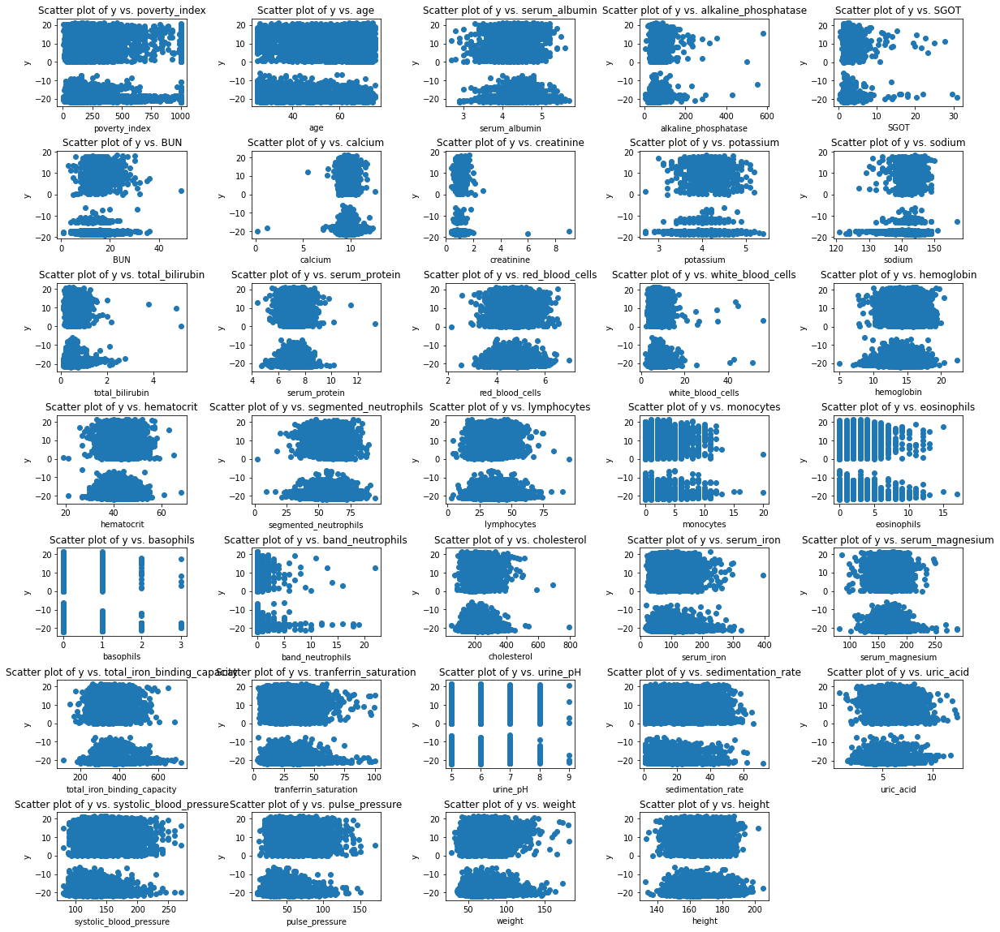

In [ ]:
# Define numerical values
numerical = ['poverty_index', 'age', 'serum_albumin', 'alkaline_phosphatase', 'SGOT', 'BUN', 'calcium', 'creatinine', 'potassium', 'sodium', 'total_bilirubin', 'serum_protein', 'red_blood_cells', 'white_blood_cells', 'hemoglobin', 'hematocrit', 'segmented_neutrophils', 'lymphocytes', 'monocytes', 'eosinophils', 'basophils', 'band_neutrophils', 'cholesterol', 'serum_iron', 'serum_magnesium', 'total_iron_binding_capacity', 'tranferrin_saturation', 'urine_pH', 'sedimentation_rate', 'uric_acid', 'systolic_blood_pressure', 'pulse_pressure', 'weight', 'height']

# Define categorical values
categorical = mortality.drop(columns=numerical+['sequence_ID','y']).columns

# Define response variables
y = mortality['y']

# Create plots
fig, axes = plt.subplots(7,5, figsize=(20, 20))
axes = axes.flatten().tolist()

# Put space between plots
fig.subplots_adjust(hspace = 0.5, wspace=0.5)

# Go through each numertical predictor
for i, pred in enumerate(numerical):
    # Create a scatter plot of that predictor against y
    axes[i].scatter(x = mortality[pred], y = y)
    # Label
    axes[i].set_xlabel(pred)
    axes[i].set_ylabel('y')
    axes[i].set_title(f'Scatter plot of y vs. {pred}')

# Delete the extra blank plot
fig.delaxes(axes[i+1])

plt.show()

#### Scatter Plot of Predictors of abs(y) 

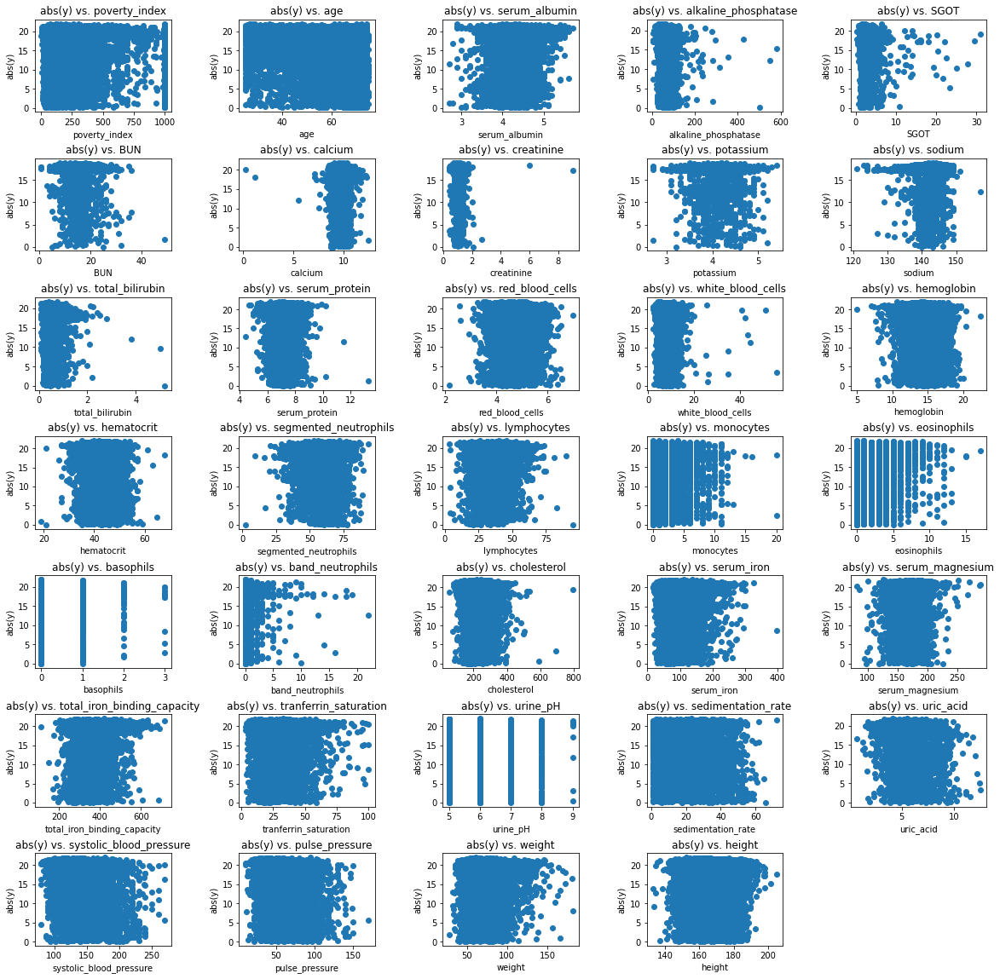

In [ ]:
# Numerical predictors
numerical = ['poverty_index', 'age', 'serum_albumin', 'alkaline_phosphatase', 'SGOT', 'BUN', 'calcium', 'creatinine', 'potassium', 'sodium', 'total_bilirubin', 'serum_protein', 'red_blood_cells', 'white_blood_cells', 'hemoglobin', 'hematocrit', 'segmented_neutrophils', 'lymphocytes', 'monocytes', 'eosinophils', 'basophils', 'band_neutrophils', 'cholesterol', 'serum_iron', 'serum_magnesium', 'total_iron_binding_capacity', 'tranferrin_saturation', 'urine_pH', 'sedimentation_rate', 'uric_acid', 'systolic_blood_pressure', 'pulse_pressure', 'weight', 'height']

# Absolute value of y
y_abs = abs(mortality['y'])
mortality['abs_y'] = y_abs

# Create plots
fig, axes = plt.subplots(7,5, figsize=(20, 20))
axes = axes.flatten().tolist()

# Put space between plots
fig.subplots_adjust(hspace = 0.5, wspace=0.5)

# Go through each numertical predictor
for i, pred in enumerate(numerical):
    # Create a scatter plot of that predictor against y
    axes[i].scatter(x = mortality[pred], y = y_abs)
    # Label
    axes[i].set_xlabel(pred)
    axes[i].set_ylabel('abs(y)')
    axes[i].set_title(f'abs(y) vs. {pred}')

# Delete the extra blank plot
fig.delaxes(axes[i+1])

plt.show()

### Visualizations based on Categorical Variables

#### Boxplots

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


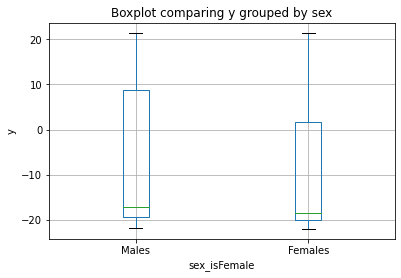

In [ ]:
# Create a boxplot comparing years survived since the initial examination till death
# Grouped by males and females
axes = mortality.boxplot(column='y', by='sex_isFemale', return_type='axes')
axes[0].set_ylabel('y')
axes[0].set_xticklabels(['Males', 'Females'])
axes[0].get_figure().suptitle('')
axes[0].set_title('Boxplot comparing y grouped by sex')
plt.show()

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


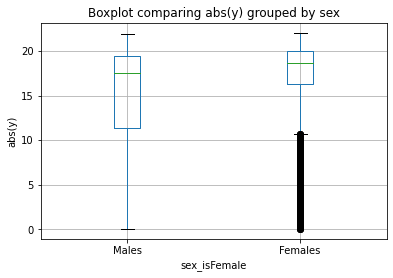

In [ ]:
# Create a boxplot comparing absolute years survived since the initial examination till death
# Grouped by males and females
axes = mortality.boxplot(column='abs_y', by='sex_isFemale', return_type='axes')
axes[0].set_ylabel('abs(y)')
axes[0].set_xticklabels(['Males', 'Females'])
axes[0].get_figure().suptitle('')
axes[0].set_title('Boxplot comparing abs(y) grouped by sex')
plt.show()

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


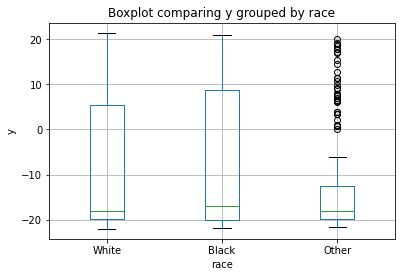

In [ ]:
# Create a boxplot comparing years that survived since the initial examination till death
# Grouped by white, black, other, and unknown
axes = mortality.boxplot(column='y', by='race', return_type='axes')
axes[0].set_ylabel('y')
axes[0].get_figure().suptitle('')
axes[0].set_xticklabels(['White', 'Black', 'Other'])
axes[0].set_title('Boxplot comparing y grouped by race')
plt.show()

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


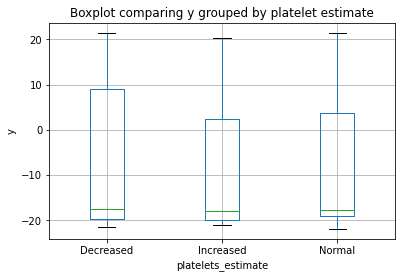

In [ ]:
# Create a boxplot comparing years that survived since the initial examination till death
# Grouped by decreased platelet estimate, increased platelet estimate, and normal platelet estimte
axes = mortality.boxplot(column='y', by='platelets_estimate', return_type='axes')
axes[0].get_figure().suptitle('')
axes[0].set_ylabel('y')
axes[0].set_title('Boxplot comparing y grouped by platelet estimate')
plt.show()

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


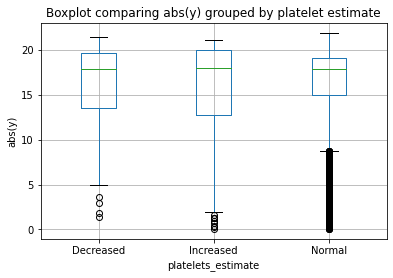

In [ ]:
# Create a boxplot comparing absolute years that survived since the initial examination till death
# Grouped by decreased platelet estimate, increased platelet estimate, and normal platelet estimte
axes = mortality.boxplot(column='abs_y', by='platelets_estimate', return_type='axes')
axes[0].get_figure().suptitle('')
axes[0].set_ylabel('abs(y)')
axes[0].set_title('Boxplot comparing abs(y) grouped by platelet estimate')
plt.show()

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


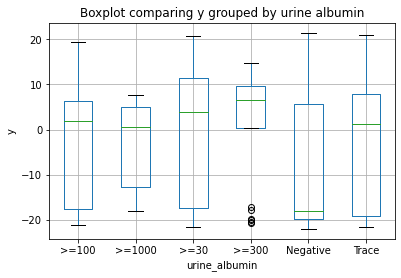

In [ ]:
# Create a boxplot comparing years that survived since the initial examination till death
# Grouped by various urine albumin levels
axes = mortality.boxplot(column='y', by='urine_albumin', return_type='axes')
axes[0].set_ylabel('y')
axes[0].get_figure().suptitle('')
axes[0].set_title('Boxplot comparing y grouped by urine albumin')
plt.show()

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


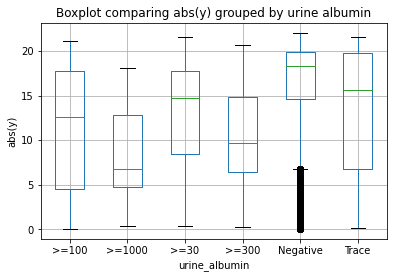

In [ ]:
# Create a boxplot comparing absolute years that survived since the initial examination till death
# Grouped by various urine albumin levels
axes = mortality.boxplot(column='abs_y', by='urine_albumin', return_type='axes')
axes[0].set_ylabel('abs(y)')
axes[0].get_figure().suptitle('')
axes[0].set_title('Boxplot comparing abs(y) grouped by urine albumin')
plt.show()

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


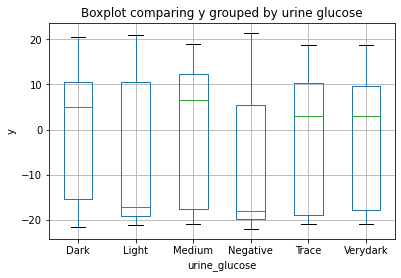

In [ ]:
# Create a boxplot comparing years that survived since the initial examination till death
# Grouped by various urine glucose levels
axes = mortality.boxplot(column='y', by='urine_glucose', return_type='axes')
axes[0].set_ylabel('y')
axes[0].get_figure().suptitle('')
axes[0].set_title('Boxplot comparing y grouped by urine glucose')
plt.show()

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


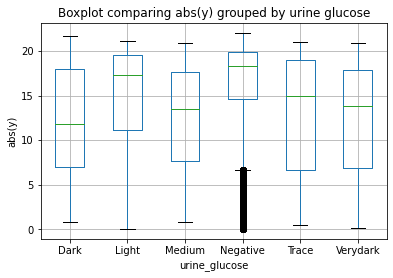

In [ ]:
# Create a boxplot comparing absolute years that survived since the initial examination till death
# Grouped by various urine glucose levels
axes = mortality.boxplot(column='abs_y', by='urine_glucose', return_type='axes')
axes[0].set_ylabel('abs(y)')
axes[0].get_figure().suptitle('')
axes[0].set_title('Boxplot comparing abs(y) grouped by urine glucose')
plt.show()

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray


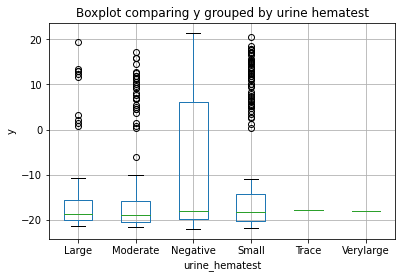

In [ ]:
# Create a boxplot comparing years that survived since the initial examination till death
# Grouped by various urine hematest levels
axes = mortality.boxplot(column='y', by='urine_hematest', return_type='axes')
axes[0].set_ylabel('y')
axes[0].get_figure().suptitle('')
axes[0].set_title('Boxplot comparing y grouped by urine hematest')
plt.show()

### Pairplot

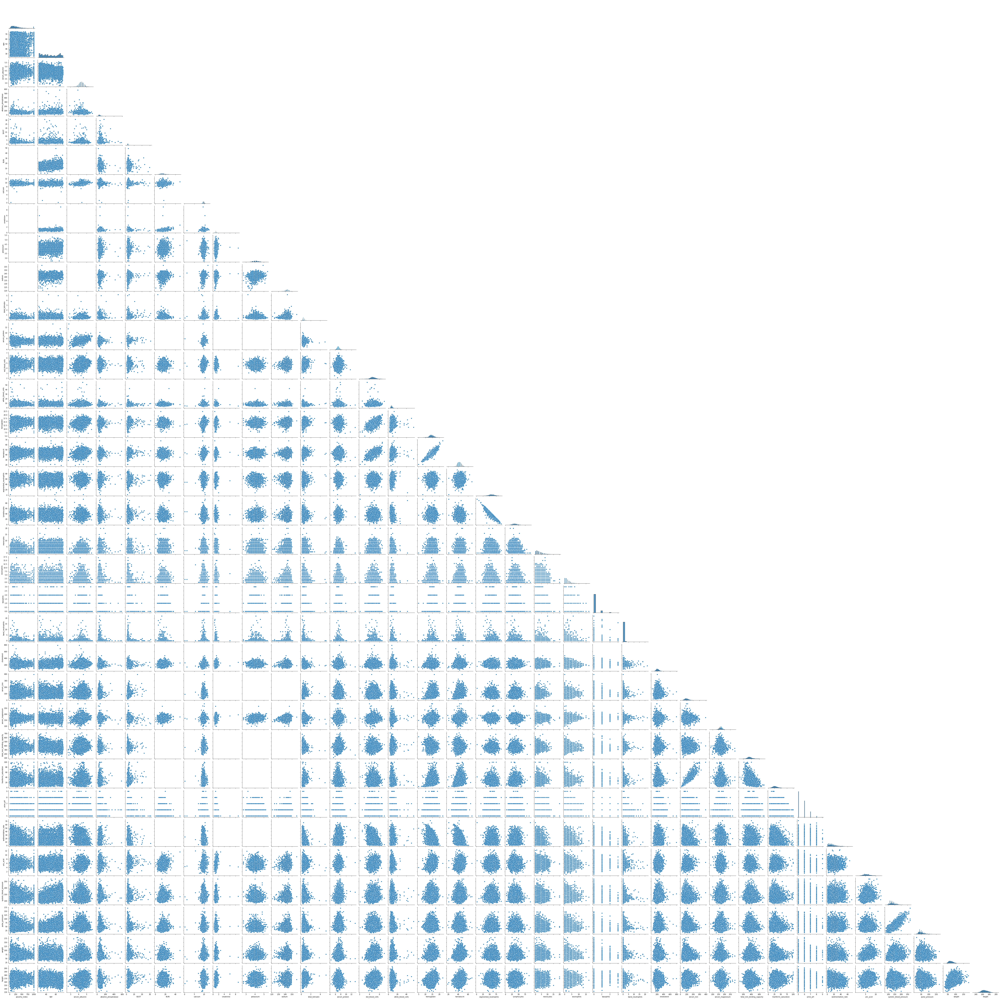

In [ ]:
# Creates a scatterplot for each pair of numerical predictors
sns.pairplot(mortality[numerical], corner=True)

### Correlations

In [ ]:
# List to store combinations of predictors/response
pred_combos = []
# Get correlation matrix
correlations = mortality.corr()
# Get all the column names in our correlation matrix
column_names = correlations.columns
count = 0
# Go through each colmn
for i in range(len(column_names)):
    col = column_names[i]
    for j in range(i,len(column_names)):
        row = column_names[j]
        # Check if the correlation between the response and predictor
        # or correlation between two predictors is above 0.6
        if abs(correlations[row][col]) > 0.6 and col != row:
            # Store that combination and correlation
            pred_combos.append((row, col, correlations[row][col]))
            
display(correlations)

,sequence_ID,sex_isFemale,race,poverty_index,age,serum_albumin,alkaline_phosphatase,SGOT,BUN,calcium,creatinine,potassium,sodium,total_bilirubin,serum_protein,red_blood_cells,white_blood_cells,hemoglobin,hematocrit,segmented_neutrophils,lymphocytes,monocytes,eosinophils,basophils,band_neutrophils,cholesterol,serum_iron,serum_magnesium,total_iron_binding_capacity,tranferrin_saturation,urine_pH,sedimentation_rate,uric_acid,systolic_blood_pressure,pulse_pressure,weight,height,y,abs_y
sequence_ID,1.000,-0.023,-1.492e-01,-0.021,-0.075,0.010,0.070,3.783e-02,0.022,0.019,6.171e-02,-0.032,-2.023e-01,0.208,-0.093,0.071,3.055e-02,-6.770e-02,-0.071,-0.005,-6.426e-02,0.273,-4.009e-02,0.110,-7.278e-03,-0.003,-0.022,6.451e-02,0.004,-0.026,-2.088e-01,-0.264,0.034,-7.592e-02,-1.107e-01,0.014,0.059,-9.111e-02,-0.056
sex_isFemale,-0.023,1.000,1.647e-02,-0.064,-0.136,-0.118,-0.080,-1.650e-01,-0.245,-0.076,-3.395e-01,-0.140,-8.127e-02,-0.234,0.002,-0.454,-2.578e-02,-5.654e-01,-0.551,0.001,3.555e-02,-0.060,-9.066e-02,-0.007,-3.576e-03,0.005,-0.108,-8.559e-02,0.180,-0.165,2.909e-02,0.272,-0.465,-8.259e-02,-1.526e-02,-0.346,-0.674,-1.619e-01,0.187
race,-0.149,0.016,1.000e+00,-0.152,-0.008,-0.088,0.034,7.269e-02,-0.075,0.030,-1.688e-02,-0.004,9.604e-05,-0.056,0.219,-0.075,-1.008e-01,-1.759e-01,-0.120,-0.163,1.779e-01,-0.038,8.324e-03,-0.026,-3.496e-02,-0.017,-0.076,-1.360e-01,-0.021,-0.063,3.069e-02,0.181,0.064,9.968e-02,5.192e-02,0.045,-0.050,5.189e-02,-0.056
poverty_index,-0.021,-0.064,-1.517e-01,1.000,-0.038,0.073,-0.058,-2.153e-02,NaN,-0.007,NaN,NaN,NaN,0.022,-0.097,0.043,5.866e-03,8.699e-02,0.068,0.024,-2.819e-02,0.021,9.045e-03,-0.009,-1.485e-02,0.019,0.088,3.759e-02,-0.022,0.086,2.477e-03,-0.130,0.011,-9.401e-02,-7.972e-02,-0.019,0.110,-7.689e-02,0.100
age,-0.075,-0.136,-7.883e-03,-0.038,1.000,-0.208,0.194,3.988e-02,0.339,-0.049,1.413e-01,0.090,5.840e-02,-0.047,-0.039,0.021,-7.152e-02,7.415e-02,0.102,0.014,-7.539e-03,-0.029,1.684e-02,-0.030,-1.710e-02,0.347,-0.017,7.878e-02,-0.252,0.081,-5.962e-02,0.202,0.145,5.059e-01,4.999e-01,0.038,-0.121,5.540e-01,-0.453
serum_albumin,0.010,-0.118,-8.802e-02,0.073,-0.208,1.000,-0.101,2.728e-02,NaN,0.370,NaN,NaN,NaN,0.121,0.445,0.203,1.038e-02,2.508e-01,0.217,-0.016,6.014e-03,0.068,-3.178e-02,0.021,1.511e-02,0.068,0.112,1.684e-01,0.126,0.044,1.587e-02,-0.254,0.119,-6.357e-02,-9.877e-02,0.026,0.126,-1.462e-01,0.171
alkaline_phosphatase,0.070,-0.080,3.396e-02,-0.058,0.194,-0.101,1.000,1.746e-01,0.028,0.006,4.410e-02,0.040,-5.335e-03,0.106,0.102,0.075,7.619e-02,7.219e-02,0.086,0.042,-5.759e-02,0.049,7.420e-03,0.012,3.219e-03,0.103,-0.027,1.227e-02,-0.018,-0.017,-2.009e-02,0.133,0.134,1.770e-01,1.383e-01,0.107,-0.014,1.760e-01,-0.177
SGOT,0.038,-0.165,7.269e-02,-0.022,0.040,0.027,0.175,1.000e+00,0.057,0.065,4.323e-02,0.006,2.512e-02,0.203,0.142,0.075,6.614e-03,1.177e-01,0.123,-0.031,2.292e-02,0.035,-1.149e-02,0.023,-7.797e-04,0.030,0.165,-6.169e-02,0.036,0.135,-1.937e-02,0.004,0.190,9.112e-02,3.933e-02,0.095,0.111,8.978e-02,-0.089
BUN,0.022,-0.245,-7.466e-02,NaN,0.339,NaN,0.028,5.695e-02,1.000,0.074,3.154e-01,0.123,9.648e-02,0.037,NaN,0.114,-2.731e-02,1.326e-01,0.126,-0.027,-1.842e-03,0.064,7.203e-02,-0.004,-3.611e-02,0.170,NaN,9.651e-02,NaN,NaN,-6.045e-02,NaN,0.286,1.710e-01,1.472e-01,0.169,0.104,1.294e-01,-0.122
calcium,0.019,-0.076,2.961e-02,-0.007,-0.049,0.370,0.006,6.522e-02,0.074,1.000,7.793e-02,0.061,1.805e-01,0.091,0.288,0.183,8.797e-02,1.843e-01,0.176,-0.026,2.161e-02,0.023,-1.213e-02,0.006,-2.226e-03,0.169,0.054,7.743e-02,0.161,-0.027,1.911e-02,-0.054,0.129,4.367e-02,-8.637e-03,0.050,0.068,-8.853e-03,-0.003


#### Display variables with correlation above 0.6

Correlation of sex_isFemale vs height: -0.6740098473164745
Correlation of red_blood_cells vs hemoglobin: 0.6997393116618635
Correlation of red_blood_cells vs hematocrit: 0.7444551216146654
Correlation of hemoglobin vs hematocrit: 0.9154147576551465
Correlation of segmented_neutrophils vs lymphocytes: -0.9253751215513111
Correlation of serum_iron vs tranferrin_saturation: 0.9055657333870066
Correlation of systolic_blood_pressure vs pulse_pressure: 0.8520625460846935
Correlation of y vs abs_y: -0.6170634939773824


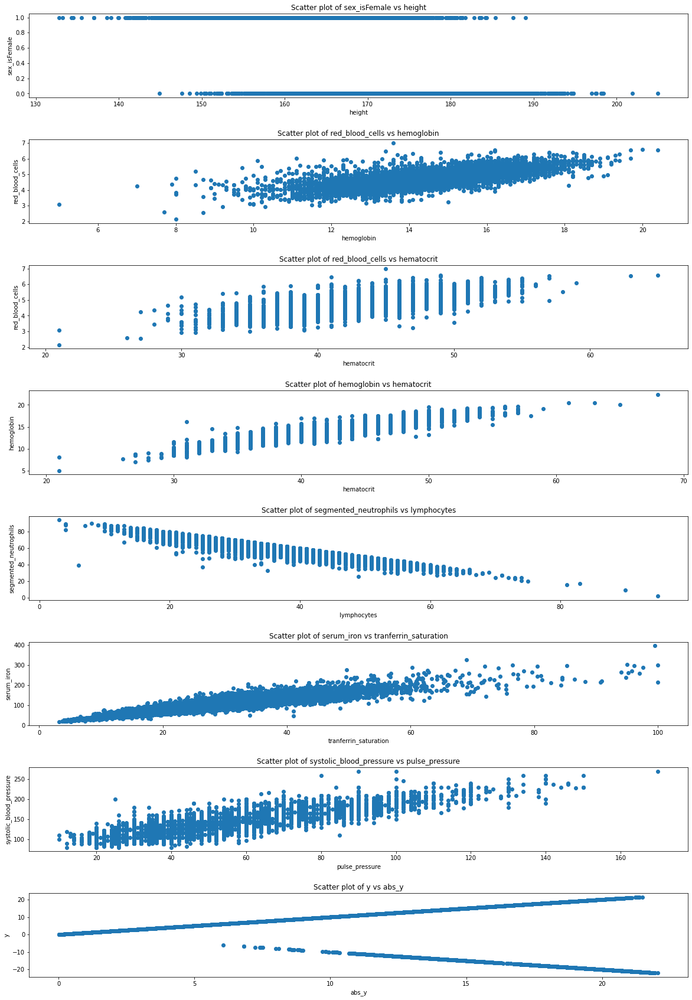

In [ ]:
# Create plots
fig, axes = plt.subplots(len(pred_combos),figsize=(20,30))
fig.subplots_adjust(hspace = 0.5, wspace=0.5)
for i, combo in enumerate(pred_combos):
    # Get the column names 
    var_1 = combo[0]
    var_2 = combo[1]
    # Print out the corresponding correlation
    print(f"Correlation of {var_2} vs {var_1}: {combo[2]}")
    # Output a scatter plot of the combination
    axes[i].scatter(x=mortality[var_1], y=mortality[var_2])
    # Label
    axes[i].set_xlabel(var_1)
    axes[i].set_ylabel(var_2)
    axes[i].set_title(f'Scatter plot of {var_2} vs {var_1}')

plt.show()

### Distributions

We plotted distributions in order to explore any anomalies in the data. Then we took a further look at marginal distributions by sex and race.

#### Distributions of variables

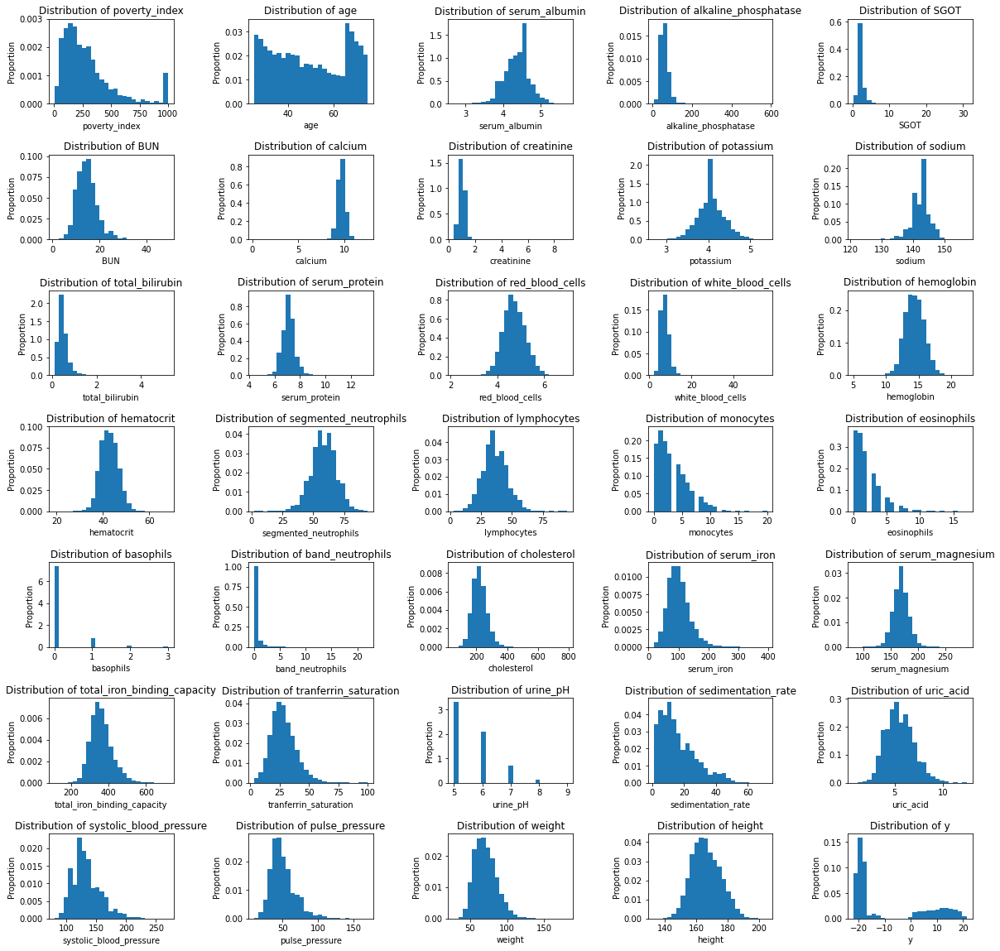

In [ ]:
# Create plots
fig, axes = plt.subplots(7,5, figsize=(20, 20))
axes = axes.flatten().tolist()
fig.subplots_adjust(hspace = 0.6, wspace=0.6)

# Go through each plot
for i, pred in enumerate((mortality[numerical+['y']]).columns):
    # Create a histogram  of the plots
    axes[i].hist(mortality[pred], density=True, bins=25)
    # Label
    axes[i].set_xlabel(pred)
    axes[i].set_ylabel('Proportion')
    axes[i].set_title(f'Distribution of {pred}')

plt.show()

#### Marginal Distributions by Sex

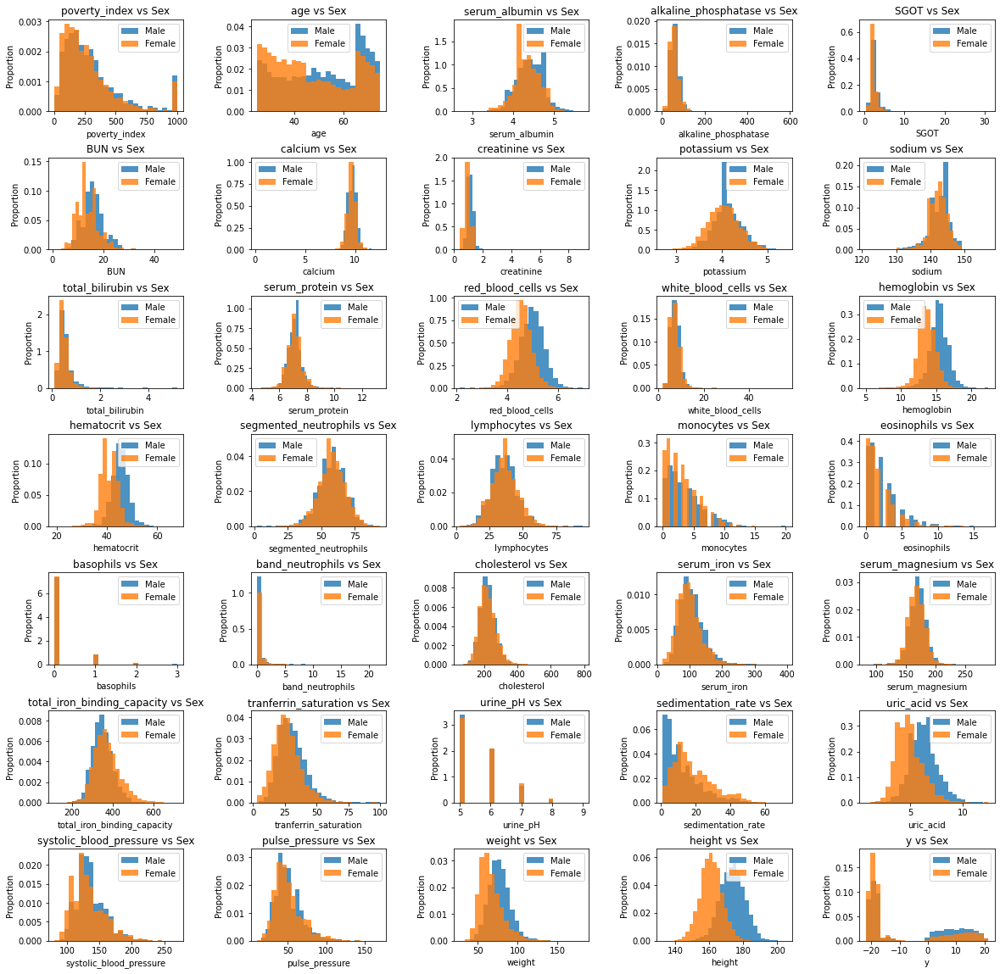

In [ ]:
# Create plots
fig, axes = plt.subplots(7,5, figsize=(20, 20))
axes = axes.flatten().tolist()
fig.subplots_adjust(hspace = 0.5, wspace=0.5)

# Go through all the numerical predictors along with y
for i, pred in enumerate((mortality[numerical+['y']]).columns):
    # Plot histograms for that predictor for males
    axes[i].hist(mortality[mortality['sex_isFemale'] == 0][pred], density=True, bins=25, alpha=0.8, label='Male')
    # Plot histograms for that predictor for females
    axes[i].hist(mortality[mortality['sex_isFemale'] == 1][pred], density=True, bins=25, alpha=0.8, label='Female')
    # Label
    axes[i].set_xlabel(pred)
    axes[i].set_ylabel('Proportion')
    axes[i].set_title(f'{pred} vs Sex')
    axes[i].legend()

plt.show()

#### Marginal Distributions by Race

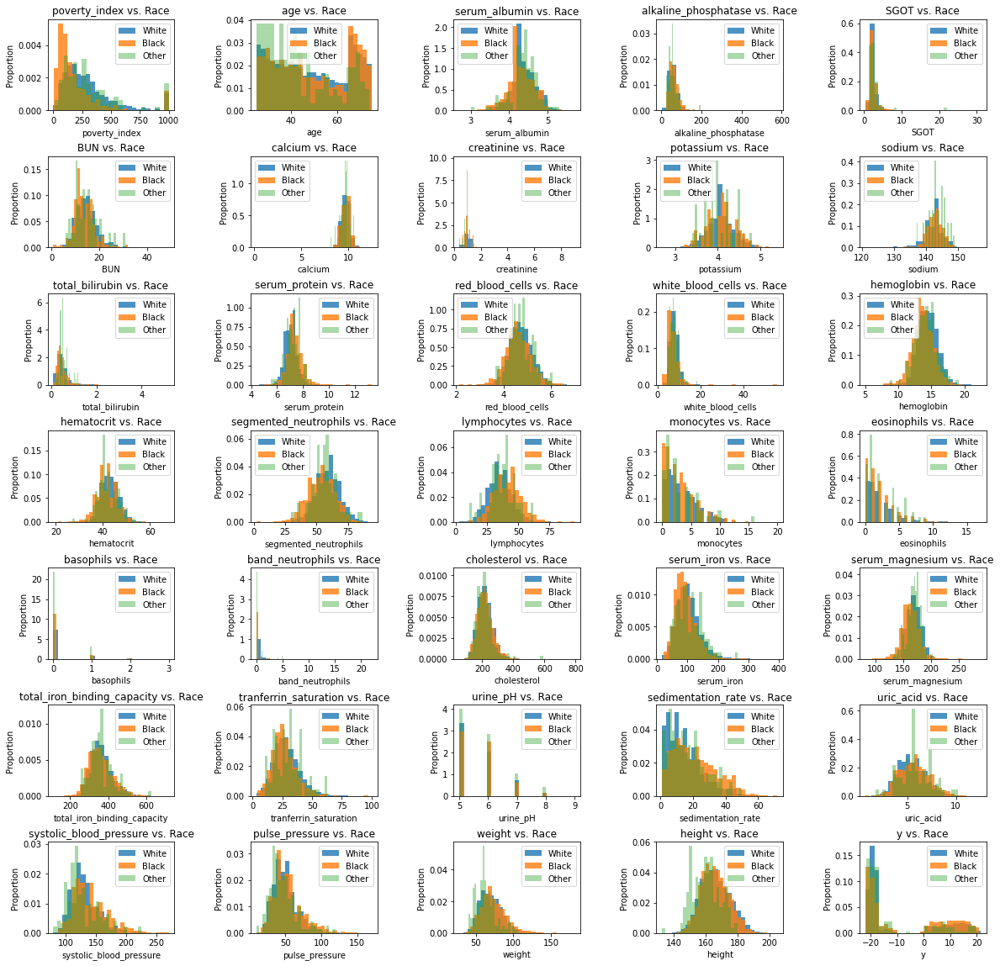

In [ ]:
# Create plots
fig, axes = plt.subplots(7,5, figsize=(20, 20))
axes = axes.flatten().tolist()
fig.subplots_adjust(hspace = 0.5, wspace=0.6)

# Go through all the numerical predictors along with y
for i, pred in enumerate((mortality[numerical+['y']]).columns):
    # Create a histogram of the predictor on race being white
    axes[i].hist(mortality[mortality['race'] == 1][pred], density=True, bins=25, alpha=0.8, label='White')
    # Create a histogram of the predictor on race being black
    axes[i].hist(mortality[mortality['race'] == 2][pred], density=True, bins=25, alpha=0.8, label='Black')
    # Create a histogram of the predictor on race being other
    axes[i].hist(mortality[mortality['race'] == 3][pred], density=True, bins=25, alpha=0.4, label='Other')
    # Label
    axes[i].set_xlabel(pred)
    axes[i].set_ylabel('Proportion')
    axes[i].set_title(f'{pred} vs. Race')
    axes[i].legend()

plt.show()

## Data Preparation 

### One Hot Encoding

In [ ]:
# Create a copy of the dataset
encoded_df = mortality.copy(deep=True)

# Create a column that specifies whether or not the participant is a female or not
encoded_sex = pd.get_dummies(encoded_df["sex_isFemale"], drop_first=True).rename({1: 'is_female'}, axis=1)
# Create columns for whether the participant is a specific race or not
encoded_race = pd.get_dummies(encoded_df["race"]).rename({1: 'is_white', 2: 'is_black', 3:'is_other'}, axis=1)
# Create columns for whether or not the participant has a specific platelet estimate
encoded_platelets = pd.get_dummies(encoded_df["platelets_estimate"]).rename({'Decreased': 'decreased_platelets', 'Increased': 'increased_platelets', 'Normal':'normal_platelets'}, axis=1)
# Create columns for whether or not the participant has a specific level of urine albumin
encoded_ualbumin = pd.get_dummies(encoded_df["urine_albumin"]).rename({'>=100': 'ualbumin_100', '>=1000': 'ualbumin_1000', '>=30':'ualbumin_30', '>=300':'ualbumin_300', 'Negative':'ualbumin_negative', 'Trace':'ualbumin_trace'}, axis=1)

# Create columns for whether or not the participant has a specific level of urine glucose
labels = {}
for shade in pd.get_dummies(encoded_df["urine_glucose"]).columns:
    labels[shade] = 'uglucose_' + shade.lower()
encoded_uglucose = pd.get_dummies(encoded_df["urine_glucose"]).rename(labels, axis=1)

# Create columns for whether or not the participant has a specific level of urine hematest
labels = {}
for size in pd.get_dummies(encoded_df["urine_hematest"]).columns:
    labels[size] = 'uhematest_' + size.lower()
encoded_uhematest = pd.get_dummies(encoded_df["urine_hematest"]).rename(labels, axis=1)

# Concatenate the encoded columns to the dataframe
encoded_df = pd.concat([encoded_df, encoded_sex, encoded_race, encoded_platelets, encoded_ualbumin, encoded_uhematest], axis=1)
# Drop the columns we encoded for
encoded_df.drop(columns=categorical,inplace=True)
# Drop the sequence ID and the response
encoded_df.drop(columns=["sequence_ID", "y", "abs_y"],inplace=True)

### Splitting the Dataset

In [ ]:
# Identify predictor and response variables
X = encoded_df.copy(deep=True)
y = mortality['y']

# Indicator used to stratify the train-test split in order to ensure we have similar proportions of negative and postive y values
confirmed = y<0

# Split the dataset with 80% being training and 20% being test 
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, random_state=random_seed, stratify=confirmed)

### Data Imputation

In [ ]:
# use iterative imputer to impute missing values
# set min_value to 0 in order to prevent negative values, which are impossible for this dataset

imp = IterativeImputer(random_state=0, min_value=0)

# impute values
X_train = imp.fit_transform(X_train)
X_test = imp.transform(X_test)

# turn back into dataframe to preserve column names
X_train = pd.DataFrame(X_train, columns = encoded_df.columns)
X_test = pd.DataFrame(X_test, columns = encoded_df.columns)

### Experimentation

In [ ]:
# We wanted to see what would happen if we tried splitting the dataset
# On postive and negative values of y
X_train_neg = X_train.iloc[np.where(y_train < 0)]
y_train_neg = y_train.iloc[np.where(y_train < 0)]
X_test_neg = X_test.iloc[np.where(y_test < 0)]
y_test_neg = y_test.iloc[np.where(y_test < 0)]

X_train_pos = X_train.iloc[np.where(y_train >= 0)]
y_train_pos = y_train.iloc[np.where(y_train >= 0)]
X_test_pos = X_test.iloc[np.where(y_test >= 0)]
y_test_pos = y_test.iloc[np.where(y_test >= 0)]

## Modelling

### Multiple Linear Regression

In [ ]:
def multiLinear(X_train, X_test, y_train, y_test):
    # Initiate linear regression model
    regression_baseline = LinearRegression()
    # Fit the model to the training data
    regression_baseline.fit(X_train, y_train)

    # Get the model predictions for the training and testing set
    y_pred_train = regression_baseline.predict(X_train)
    y_pred_test = regression_baseline.predict(X_test)

    # Get the mean squared error on the training and test set
    train_score = mean_squared_error(y_train, y_pred_train)
    test_score = mean_squared_error(y_test, y_pred_test)

    print(f"MSE score on the training set is {train_score:.4f}")
    print(f"MSE score on the test set is {test_score:.4f}")

    # Get the r-squared on train and test
    r2_train = r2_score(y_train, y_pred_train)
    r2_test = r2_score(y_test, y_pred_test)

    print(f"R-squared score on the training set is {r2_train:.4f}")
    print(f"R-squared score on the test set is {r2_test:.4f}")

# With encoding
multiLinear(X_train, X_test, y_train, y_test)
print('\n')
# With encoding, with abs
multiLinear(X_train, X_test, abs(y_train), abs(y_test))
print('\n')
# Without encoding
multiLinear(X_train[numerical], X_test[numerical], y_train, y_test)
print('\n')
# Without encoding, with abs
multiLinear(X_train[numerical], X_test[numerical], abs(y_train), abs(y_test))
print('\n')
# With encoding, positive only
multiLinear(X_train_pos, X_test_pos, y_train_pos, y_test_pos)
print('\n')
# With encoding, negative only
multiLinear(X_train_neg, X_test_neg, y_train_neg, y_test_neg)
print('\n')

MSE score on the training set is 136.6647
MSE score on the test set is 135.7133
R-squared score on the training set is 0.3429
R-squared score on the test set is 0.3367


MSE score on the training set is 19.7473
MSE score on the test set is 21.0790
R-squared score on the training set is 0.2826
R-squared score on the test set is 0.2509


MSE score on the training set is 137.6793
MSE score on the test set is 136.5709
R-squared score on the training set is 0.3380
R-squared score on the test set is 0.3325


MSE score on the training set is 20.1920
MSE score on the test set is 21.3573
R-squared score on the training set is 0.2665
R-squared score on the test set is 0.2410


MSE score on the training set is 27.7459
MSE score on the test set is 28.5724
R-squared score on the training set is 0.0873
R-squared score on the test set is 0.0485


MSE score on the training set is 3.0333
MSE score on the test set is 2.8668
R-squared score on the training set is 0.1575
R-squared score on the test set is

### Single Decision Tree

In [ ]:
def decisionTree(X_train, X_test, y_train, y_test):
    # Fit a scaler on the training data
    scaler = StandardScaler()
    scaler.fit(X_train)

    # Scale the training and testing data similarly
    X_train_scaled = scaler.transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # Initiate a decision tree
    tree = DecisionTreeRegressor(max_depth=10)
    # Fit on the scaled training data
    tree.fit(X_train_scaled, y_train)
    
    # Get the meaning squared error
    train_score = mean_squared_error(y_train, tree.predict(X_train_scaled))
    test_score = mean_squared_error(y_test, tree.predict(X_test_scaled))

    # Get r-squared 
    r2_train = tree.score(X_train_scaled,y_train)
    r2_test = tree.score(X_test_scaled,y_test)

    print(f"MSE score on the training set is {train_score:.4f}")
    print(f"MSE score on the test set is {test_score:.4f}")

    print(f"R-squared score on the training set is {r2_train:.4f}")
    print(f"R-squared score on the test set is {r2_test:.4f}")

# With encoding
decisionTree(X_train, X_test, y_train, y_test)
print('\n')
# With encoding, with abs
decisionTree(X_train, X_test, abs(y_train), abs(y_test))
print('\n')
# Without encoding
decisionTree(X_train[numerical], X_test[numerical], y_train, y_test)
print('\n')
# Without encoding, with abs
decisionTree(X_train[numerical], X_test[numerical], abs(y_train), abs(y_test))
print('\n')
# With encoding, positive only
decisionTree(X_train_pos, X_test_pos, y_train_pos, y_test_pos)
print('\n')
# With encoding, negative only
decisionTree(X_train_neg, X_test_neg, y_train_neg, y_test_neg)
print('\n')

MSE score on the training set is 90.7401
MSE score on the test set is 172.1048
R-squared score on the training set is 0.5637
R-squared score on the test set is 0.1589


MSE score on the training set is 12.8979
MSE score on the test set is 26.2139
R-squared score on the training set is 0.5314
R-squared score on the test set is 0.0684


MSE score on the training set is 88.4890
MSE score on the test set is 176.8149
R-squared score on the training set is 0.5745
R-squared score on the test set is 0.1359


MSE score on the training set is 13.3960
MSE score on the test set is 25.5429
R-squared score on the training set is 0.5133
R-squared score on the test set is 0.0922


MSE score on the training set is 16.0501
MSE score on the test set is 41.5745
R-squared score on the training set is 0.4720
R-squared score on the test set is -0.3845


MSE score on the training set is 2.0590
MSE score on the test set is 3.2731
R-squared score on the training set is 0.4281
R-squared score on the test set is 

### SHAP values

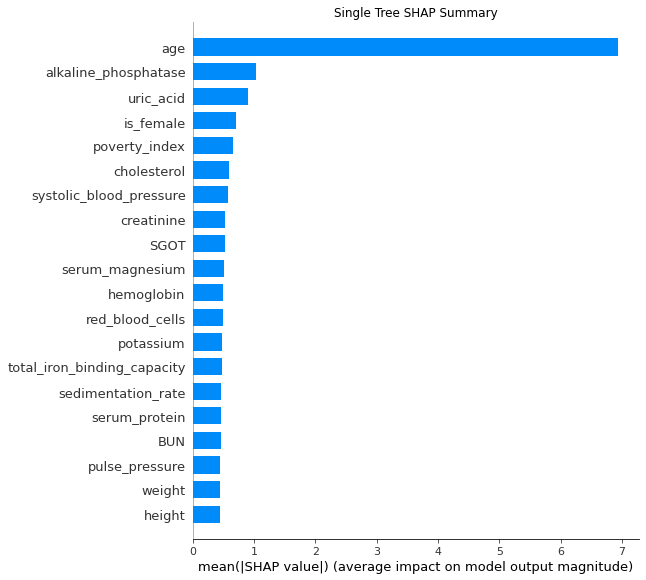

In [ ]:
# Scale the data and fit the model (to be used for SHAP compuatation)
scaler = StandardScaler()
scaler.fit(X_train)

X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Fit a decision on the scaled data
tree = DecisionTreeRegressor()
tree.fit(X_train_scaled, y_train)

# compute and graph SHAP values

shap_values = shap.TreeExplainer(tree).shap_values(shap.sample(X_train_scaled, 1000))
shap.summary_plot(shap_values, X_train_scaled, feature_names=X_train.columns, plot_type="bar", show=False)

# save figure
plt.title("Single Tree SHAP Summary")
plt.savefig("Single_Tree_SHAP_Summary")

### Random Forest

In [ ]:
def randomForest(X_train, X_test, y_train, y_test):
    # Scale the data
    scaler = StandardScaler()
    scaler.fit(X_train)
    X_train_scaled = scaler.transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # Fit a random forest
    model = RandomForestRegressor(n_estimators=30, random_state=0)
    model.fit(X_train_scaled, y_train)

    # Get the meaning squared error
    train_score = mean_squared_error(y_train, model.predict(X_train_scaled))
    test_score = mean_squared_error(y_test, model.predict(X_test_scaled))

    # Get r-squared 
    r2_train = model.score(X_train_scaled,y_train)
    r2_test = model.score(X_test_scaled,y_test)

    print(f"MSE score on the training set is {train_score:.4f}")
    print(f"MSE score on the test set is {test_score:.4f}")

    print(f"R-squared score on the training set is {r2_train:.4f}")
    print(f"R-squared score on the test set is {r2_test:.4f}")

    # Get a list of the columns
    feature_list = list(X_train.columns)
    # Get the feature importance of each predictor
    feature_importance = pd.Series(model.feature_importances_, index=feature_list).sort_values(ascending=False)

    display(feature_importance)

# With encoding
randomForest(X_train, X_test, y_train, y_test)
print('\n')
# With encoding, with abs
randomForest(X_train, X_test, abs(y_train), abs(y_test))
print('\n')
# Without encoding
randomForest(X_train[numerical], X_test[numerical], y_train, y_test)
print('\n')
# Without encoding, with abs
randomForest(X_train[numerical], X_test[numerical], abs(y_train), abs(y_test))
print('\n')
# With encoding, positive only
randomForest(X_train_pos, X_test_pos, y_train_pos, y_test_pos)
print('\n')
# With encoding, negative only
randomForest(X_train_neg, X_test_neg, y_train_neg, y_test_neg)
print('\n')

MSE score on the training set is 21.4560
MSE score on the test set is 136.2687
R-squared score on the training set is 0.8968
R-squared score on the test set is 0.3340


age                            3.463e-01
alkaline_phosphatase           3.020e-02
cholesterol                    2.667e-02
SGOT                           2.615e-02
weight                         2.585e-02
serum_magnesium                2.575e-02
height                         2.509e-02
systolic_blood_pressure        2.342e-02
white_blood_cells              2.321e-02
uric_acid                      2.225e-02
poverty_index                  2.215e-02
creatinine                     2.110e-02
total_iron_binding_capacity    2.076e-02
red_blood_cells                2.055e-02
hemoglobin                     1.962e-02
sedimentation_rate             1.911e-02
potassium                      1.898e-02
pulse_pressure                 1.867e-02
calcium                        1.844e-02
segmented_neutrophils          1.749e-02
total_bilirubin                1.731e-02
BUN                            1.707e-02
lymphocytes                    1.706e-02
sodium                         1.666e-02
eosinophils     



MSE score on the training set is 2.9906
MSE score on the test set is 20.1706
R-squared score on the training set is 0.8914
R-squared score on the test set is 0.2832


age                            2.468e-01
alkaline_phosphatase           3.481e-02
cholesterol                    3.141e-02
white_blood_cells              3.001e-02
SGOT                           3.000e-02
weight                         2.939e-02
serum_magnesium                2.867e-02
height                         2.658e-02
red_blood_cells                2.639e-02
systolic_blood_pressure        2.634e-02
uric_acid                      2.559e-02
sedimentation_rate             2.547e-02
poverty_index                  2.493e-02
hemoglobin                     2.393e-02
creatinine                     2.177e-02
serum_protein                  2.139e-02
total_iron_binding_capacity    2.011e-02
pulse_pressure                 1.943e-02
total_bilirubin                1.920e-02
is_female                      1.905e-02
serum_albumin                  1.872e-02
BUN                            1.865e-02
lymphocytes                    1.854e-02
potassium                      1.846e-02
calcium         



MSE score on the training set is 21.4377
MSE score on the test set is 137.1443
R-squared score on the training set is 0.8969
R-squared score on the test set is 0.3297


age                            0.347
height                         0.029
alkaline_phosphatase           0.028
SGOT                           0.028
cholesterol                    0.028
serum_magnesium                0.027
weight                         0.026
uric_acid                      0.024
systolic_blood_pressure        0.023
white_blood_cells              0.023
poverty_index                  0.023
red_blood_cells                0.022
total_iron_binding_capacity    0.022
creatinine                     0.020
sedimentation_rate             0.020
calcium                        0.019
hemoglobin                     0.019
potassium                      0.019
pulse_pressure                 0.019
BUN                            0.018
total_bilirubin                0.018
lymphocytes                    0.018
sodium                         0.018
serum_iron                     0.017
segmented_neutrophils          0.017
eosinophils                    0.017
band_neutrophils               0.017
m



MSE score on the training set is 3.0121
MSE score on the test set is 20.3992
R-squared score on the training set is 0.8906
R-squared score on the test set is 0.2750


age                            0.247
SGOT                           0.037
alkaline_phosphatase           0.036
height                         0.035
cholesterol                    0.032
uric_acid                      0.031
white_blood_cells              0.030
weight                         0.030
serum_magnesium                0.027
poverty_index                  0.027
systolic_blood_pressure        0.026
red_blood_cells                0.026
hemoglobin                     0.024
creatinine                     0.023
total_iron_binding_capacity    0.023
sedimentation_rate             0.022
serum_protein                  0.021
serum_albumin                  0.020
sodium                         0.020
pulse_pressure                 0.020
lymphocytes                    0.019
band_neutrophils               0.019
potassium                      0.019
total_bilirubin                0.019
calcium                        0.019
eosinophils                    0.018
serum_iron                     0.018
s



MSE score on the training set is 4.4153
MSE score on the test set is 29.0976
R-squared score on the training set is 0.8548
R-squared score on the test set is 0.0310


alkaline_phosphatase           4.527e-02
weight                         4.240e-02
age                            4.210e-02
white_blood_cells              3.999e-02
height                         3.914e-02
red_blood_cells                3.863e-02
SGOT                           3.699e-02
serum_magnesium                3.622e-02
cholesterol                    3.591e-02
poverty_index                  3.176e-02
uric_acid                      3.148e-02
potassium                      3.028e-02
sedimentation_rate             2.976e-02
total_bilirubin                2.910e-02
total_iron_binding_capacity    2.889e-02
lymphocytes                    2.789e-02
creatinine                     2.695e-02
monocytes                      2.688e-02
hemoglobin                     2.594e-02
eosinophils                    2.549e-02
calcium                        2.474e-02
systolic_blood_pressure        2.452e-02
basophils                      2.447e-02
pulse_pressure                 2.432e-02
segmented_neutro



MSE score on the training set is 0.4333
MSE score on the test set is 2.7052
R-squared score on the training set is 0.8796
R-squared score on the test set is 0.1864


serum_protein                  1.249e-01
serum_albumin                  1.208e-01
poverty_index                  4.003e-02
sedimentation_rate             3.814e-02
height                         3.621e-02
serum_magnesium                3.280e-02
red_blood_cells                3.061e-02
alkaline_phosphatase           2.846e-02
weight                         2.809e-02
SGOT                           2.482e-02
monocytes                      2.468e-02
hemoglobin                     2.392e-02
cholesterol                    2.389e-02
white_blood_cells              2.253e-02
sodium                         2.212e-02
total_bilirubin                2.201e-02
creatinine                     2.185e-02
potassium                      2.128e-02
total_iron_binding_capacity    2.038e-02
hematocrit                     2.031e-02
serum_iron                     1.996e-02
lymphocytes                    1.991e-02
systolic_blood_pressure        1.963e-02
BUN                            1.908e-02
segmented_neutro

### SHAP Values

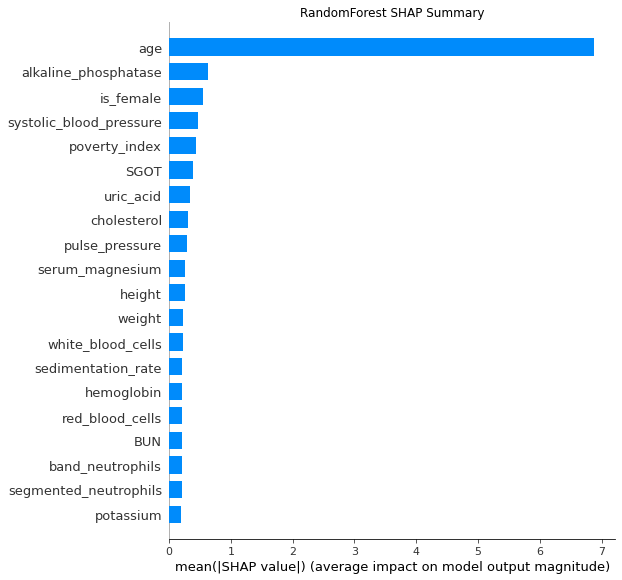

In [ ]:
# Fit a random forest model (to be used for SHAP graph)
model = RandomForestRegressor(n_estimators=30, random_state=0)
model.fit(X_train_scaled, y_train)

# compute and graph SHAP values
shap_values = shap.TreeExplainer(model).shap_values(shap.sample(X_train_scaled, 1000))
shap.summary_plot(shap_values, X_train_scaled, feature_names=X_train.columns, plot_type="bar", show=False)

# save plot
plt.title("RandomForest SHAP Summary")
plt.savefig("RandomForest_SHAP_Summary")   

### Deep Neural Network

In [ ]:
def deepNNet(X_train, X_test, y_train, y_test, epochs):
    # Normalize the training and test data
    # Normalizing the data generally speeds up learning and leads to faster convergence.
    X_train_norm = normalize(X_train)
    X_test_norm = normalize(X_test)
    
    # Sequential models are models where we define our layers one after another
    deepnn = Sequential()
    # The output of one layer serves as the input for the next
    # We are adding three layers of neurons 
    # The activation function is ReLU, Rectified Linear Units
    # This adds non-linearity to our model, enabling our layers when combined to be more expressive
    # The ReLU algorithm does ReLU(x) = max(0, x), so negative inputs become 0 and positive inputs are not affected
    # There will be 53 neurons in this layer 
    # Since this is the input layer, we want the input shape to be the number of columns we have
    deepnn.add(Dense(53, activation="relu", input_shape=(X_train_norm[0].shape)))
    # There will be 53 neurons in this layer 
    deepnn.add(Dense(53, activation="relu"))
    # There will be 1 neuron in this layer since we want to output a single value as the prediction
    deepnn.add(Dense(1))
    # Now we want to compile our model
    # The optimizer will be adam and the loss function will be mean squared error
    deepnn.compile(optimizer="adam", loss="mse", metrics=["mse"])

    num_epochs = 100
    # Now we want to fit our model on the training data over 100 epochs
    # Verbose will just output the metrics after each round of training
    # Validation data is the data on which to evaluate model metrics at the end of each epoch
    # The model will not be trained on this data
    logs = deepnn.fit(X_train_norm, y_train, epochs=epochs, batch_size=32, verbose=True, validation_data=(X_test_norm, y_test))

    # Evaluate the model
    print(deepnn.evaluate(X_train_norm, y_train))
    print(deepnn.evaluate(X_test_norm, y_test))

    return deepnn, logs

In [ ]:
# Now we want to fit our model on the training data over 100 epochs
# Verbose will just output the metrics after each round of training
# Validation data is the data on which to evaluate model metrics at the end of each epoch
# The model will not be trained on this data

# fit neural net for y, including one-hot encoded data
model, logs = deepNNet(X_train, X_test, y_train, y_test, epochs=100)

# fit neural net for abs(y), including one-hot encoded data
model_abs, logs_abs = deepNNet(X_train, X_test, abs(y_train), abs(y_test), epochs=100)

# fit neural net for positive y, including one-hot encoded data
model_pos, logs_pos = deepNNet(X_train_pos, X_test_pos, y_train_pos, y_test_pos, epochs=100)

# fit neural net for negative y, including one-hot encoded data
model_neg, logs_neg = deepNNet(X_train_neg, X_test_neg, y_train_neg, y_test_neg, epochs=100)

Instructions for updating:
If using Keras pass *_constraint arguments to layers.
Train on 11525 samples, validate on 2882 samples
Epoch 1/100
11525/11525 [==============================] - 1s 75us/sample - loss: 215.0554 - mean_squared_error: 215.0555 - val_loss: 195.3981 - val_mean_squared_error: 195.3981
Epoch 2/100
11525/11525 [==============================] - 1s 64us/sample - loss: 189.8591 - mean_squared_error: 189.8591 - val_loss: 175.6859 - val_mean_squared_error: 175.6859
Epoch 3/100
11525/11525 [==============================] - 1s 66us/sample - loss: 165.6918 - mean_squared_error: 165.6918 - val_loss: 154.2865 - val_mean_squared_error: 154.2865
Epoch 4/100
11525/11525 [==============================] - 1s 64us/sample - loss: 152.9214 - mean_squared_error: 152.9214 - val_loss: 147.9385 - val_mean_squared_error: 147.9385
Epoch 5/100
11525/11525 [==============================] - 1s 64us/sample - loss: 149.2562 - mean_squared_error: 149.2561 - val_loss: 144.9761 - val_mean_squa

In [ ]:
# Function to help with 
def dnnPlot(model_logs, y_name):
    plt.plot(model_logs.history["val_mean_squared_error"], label= "Test Set")
    plt.plot(model_logs.history["loss"], label= "Training Set")
    plt.title(f"Mean Squared Error of Deep Neural based on {y_name} over 100 Epochs")
    plt.xlabel("Epoch")
    plt.ylabel("Mean Squared Error")
    plt.legend()
    plt.show()

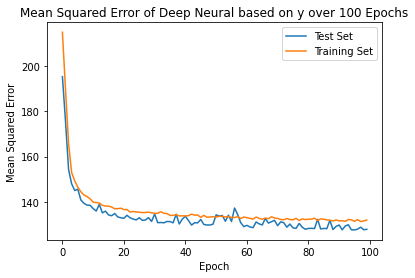

In [ ]:
# Plot the MSE of the DNN over the epochs on the training and test set for y
dnnPlot(logs, "y")

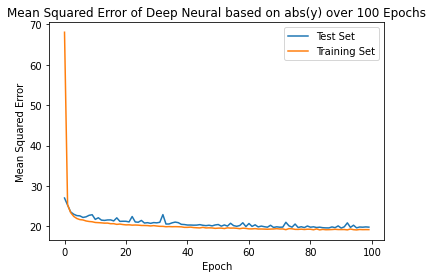

In [ ]:
# Plot the MSE of the DNN over the epochs on the training and test set for abs(y)
dnnPlot(logs_abs, "abs(y)")


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where


Using TensorFlow backend.
keras is no longer supported, please use tf.keras instead.


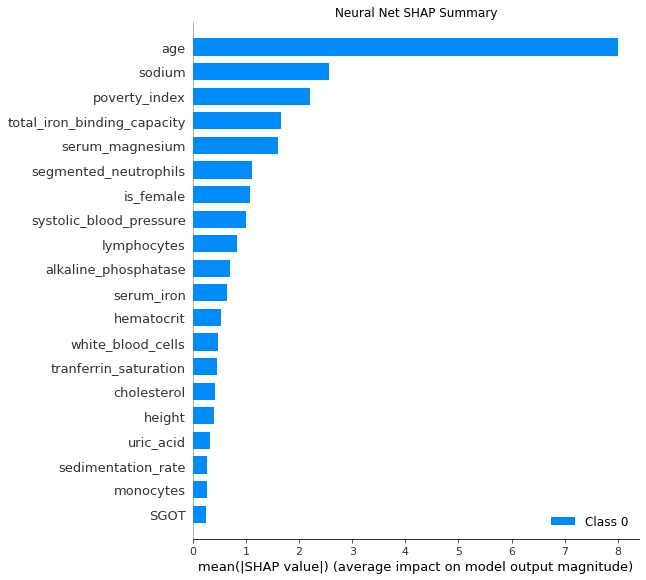

In [ ]:
# Normalize the data (used for SHAP value graph)
X_train_norm = normalize(X_train)
X_test_norm = normalize(X_test)

# compute SHAP values
nn_shap_explainer = shap.DeepExplainer(model, shap.sample(X_train_norm, 500))
nn_shap_values = nn_shap_explainer.shap_values(X_train_norm)

# plot and save graph
shap.summary_plot(nn_shap_values, X_train_norm, feature_names=X_train.columns, show=False)
plt.title("Neural Net SHAP Summary")
plt.savefig("Neural_Net_SHAP_Summary")   